# Small-Model Training

Train a small linear model over fixed embeddings, using a curated set of training data.



## Step 1: Set up


In [1]:
#@title Imports. { vertical-output: true }
import collections
import json
from ml_collections import config_dict
import numpy as np
import os
from etils import epath
import matplotlib.pyplot as plt
import tensorflow as tf
import tqdm
#
from chirp.inference import colab_utils
colab_utils.initialize(use_tf_gpu=True, disable_warnings=True)
#
from chirp.inference import tf_examples
from chirp.models import metrics
from chirp.projects.bootstrap import bootstrap
from chirp.projects.bootstrap import search
from chirp.projects.bootstrap import display
from chirp.projects.multicluster import classify
from chirp.projects.multicluster import data_lib


2024-02-14 13:56:38.895949: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-14 13:56:38.919073: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-14 13:56:46.501391: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-02-14 13:57:39.053633: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-14 13:57:39.144

In [40]:
#@title Configure data and model locations. { vertical-output: true }

# Get base path
base_dir = os.getenv('BASE_DIR')
if not base_dir:
    raise ValueError("BASE_DIR environment variable is not set.")

# Path containing TFRecords of unlabeled embeddings.
# We will load the model which was used to compute the embeddings automatically.
embeddings_path = os.path.join(base_dir, 'ucl_perch/data/australia/embeddings')  #@param

# Path to the labeled wav data.
# Should be in 'folder-of-folders' format - a folder with sub-folders for
# each class of interest.
# Audio in sub-folders should be wav files.
# Audio should ideally be 5s audio clips, but the system is quite forgiving.
labeled_data_path = os.path.join(base_dir, 'ucl_perch/data/australia/labels/meow/assisted_labels')  #@param

# Path to save output results.
output_filepath = os.path.join(base_dir, 'ucl_perch/data/australia/labels/meow/inference.csv')  #@param

# Choose the target class to work with.
target_class = 'meow'  #@param


## Step 2: Supervised Learning

In [65]:
#@title Load the model. { vertical-output: true }

# Get relevant info from the embedding configuration.
embeddings_path = epath.Path(embeddings_path)
with (embeddings_path / 'config.json').open() as f:
  embedding_config = config_dict.ConfigDict(json.loads(f.read()))
embeddings_glob = embeddings_path / 'embeddings-*'

config = bootstrap.BootstrapConfig.load_from_embedding_config(
    embeddings_path=embeddings_path,
    annotated_path=labeled_data_path)
embedding_hop_size_s = config.embedding_hop_size_s
project_state = bootstrap.BootstrapState(config)
embedding_model = project_state.embedding_model

In [66]:
# @title Load+Embed the Labeled Dataset. { vertical-output: true }

# Time-pooling strategy for examples longer than the model's window size.
time_pooling = 'mean'  # @param

merged = data_lib.MergedDataset.from_folder_of_folders(
    base_dir=labeled_data_path,
    embedding_model=embedding_model,
    time_pooling=time_pooling,
    load_audio=False,
    target_sample_rate=-2,
    audio_file_pattern='*'
)

# Label distribution
lbl_counts = np.sum(merged.data['label_hot'], axis=0)
print('num classes :', (lbl_counts > 0).sum())
print('mean ex / class :', lbl_counts.sum() / (lbl_counts > 0).sum())
print('min ex / class :', (lbl_counts + (lbl_counts == 0) * 1e6).min())

Embedding from Folder of Folders...


100%|██████████| 136/136 [00:01<00:00, 75.21it/s]


...embedded dataset in  6.39s...
    found 2 classes.
    class meow / 0 : 54
    class unknown / 1 : 136
num classes : 2
mean ex / class : 95.0
min ex / class : 54.0


In [67]:
#@title Train linear model over embeddings. { vertical-output: true }

# Number of random training examples to choose form each class.
# Set exactly one of train_ratio and train_examples_per_class
train_ratio = 0.95  #@param
train_examples_per_class = None  #@param

# Number of random re-trainings. Allows judging model stability.
num_seeds = 1  #@param

# Classifier training hyperparams.
# These should be good defaults.
batch_size = 32
num_epochs = 128
num_hiddens = -1
learning_rate = 1e-3

metrics = collections.defaultdict(list)
for seed in tqdm.tqdm(range(num_seeds)):
  if num_hiddens > 0:
    model = classify.get_two_layer_model(
        num_hiddens, merged.embedding_dim, merged.num_classes)
  else:
    model = classify.get_linear_model(
        merged.embedding_dim, merged.num_classes)
  run_metrics = classify.train_embedding_model(
      model, merged, train_ratio, train_examples_per_class,
      num_epochs, seed, batch_size, learning_rate)
  metrics['acc'].append(run_metrics.top1_accuracy)
  metrics['auc_roc'].append(run_metrics.auc_roc)
  metrics['cmap'].append(run_metrics.cmap_value)
  metrics['maps'].append(run_metrics.class_maps)
  metrics['test_logits'].append(run_metrics.test_logits)

mean_acc = np.mean(metrics['acc'])
mean_auc = np.mean(metrics['auc_roc'])
mean_cmap = np.mean(metrics['cmap'])
# Merge the test_logits into a single array.
test_logits = {
    k: np.concatenate([logits[k] for logits in metrics['test_logits']])
    for k in metrics['test_logits'][0].keys()
}

print(f'acc:{mean_acc:5.2f}, auc_roc:{mean_auc:5.2f}, cmap:{mean_cmap:5.2f}')
for lbl, auc in zip(merged.labels, run_metrics.class_maps):
  if np.isnan(auc):
    continue
  print(f'\n{lbl:8s}, auc_roc:{auc:5.2f}')
  colab_utils.prstats(f'test_logits({lbl})',
                      test_logits[merged.labels.index(lbl)])

  0%|          | 0/1 [00:00<?, ?it/s]2024-02-14 15:38:33.884138: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 15569514938820782663
2024-02-14 15:38:33.884195: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 14514435855542377407
2024-02-14 15:38:33.884201: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 654196341047847983
2024-02-14 15:39:11.895057: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 7426049540897706266
100%|██████████| 1/1 [00:40<00:00, 40.07s/it]

acc: 1.00, auc_roc: 1.00, cmap: 1.00

meow    , auc_roc: 1.00
test_logits(meow) : 	shape:             (2,)	min:   0.49	mean:   2.02	max:   3.54	std:   1.53

unknown , auc_roc: 1.00
test_logits(unknown) : 	shape:             (6,)	min:   1.36	mean:   2.10	max:   2.84	std:   0.61


## Step 3: Evaluation on Unlabeled Data
- Here we run our model on the remaining dataset, which is so far unlabeled.
- This can be used to evaluate performance, and/or, used to repeat the process by adding new labels and returning to step 2.

240it [00:00, 1679.54it/s]


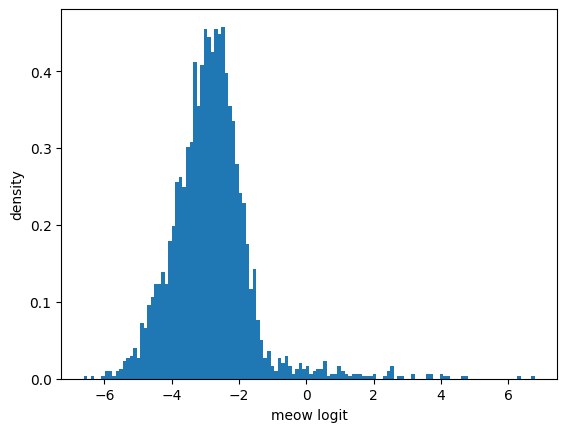

In [68]:
#@title Run model on target unlabeled data. { vertical-output: true }

# Choose a target logit; will display results close to the target.
# Set to None to get the highest-logit examples.
target_logit = None  #@param
# Number of results to display.
num_results = 25  #@param

# Create the embeddings dataset.
embeddings_ds = tf_examples.create_embeddings_dataset(
    embeddings_path, file_glob='embeddings-*')
target_class_idx = merged.labels.index(target_class)
results, all_logits = search.classifer_search_embeddings_parallel(
    embeddings_classifier=model,
    target_index=target_class_idx,
    embeddings_dataset=embeddings_ds,
    hop_size_s=embedding_hop_size_s,
    target_score=target_logit,
    top_k=num_results
)

# Plot the histogram of logits.
_, ys, _ = plt.hist(all_logits, bins=128, density=True)
plt.xlabel(f'{target_class} logit')
plt.ylabel('density')
# plt.yscale('log')
plt.plot([target_logit, target_logit], [0.0, np.max(ys)], 'r:')
plt.show()

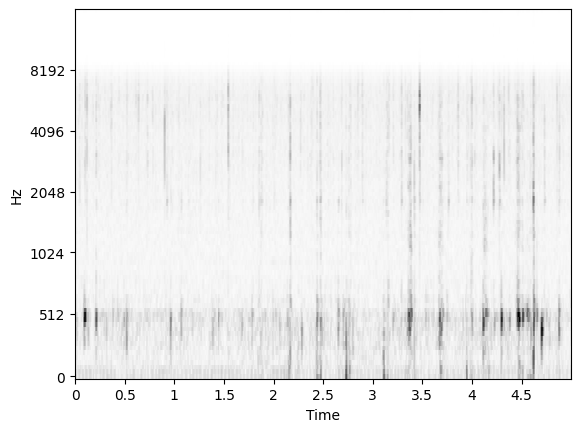

rank        : 0
source file : raw_audio/20230220_050000.WAV
offset_s    : 15.00
score       : -1.00


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


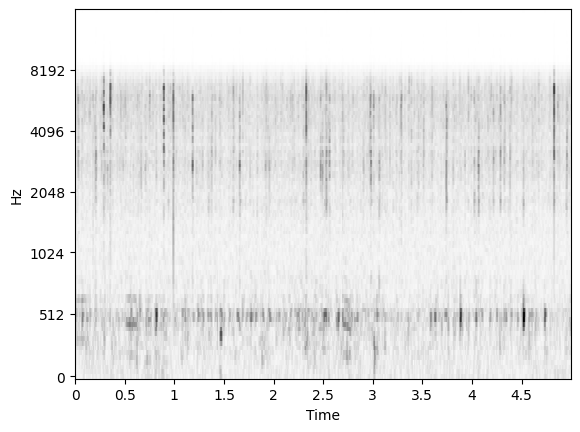

rank        : 1
source file : raw_audio/20230219_200000.WAV
offset_s    : 45.00
score       : -1.00


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


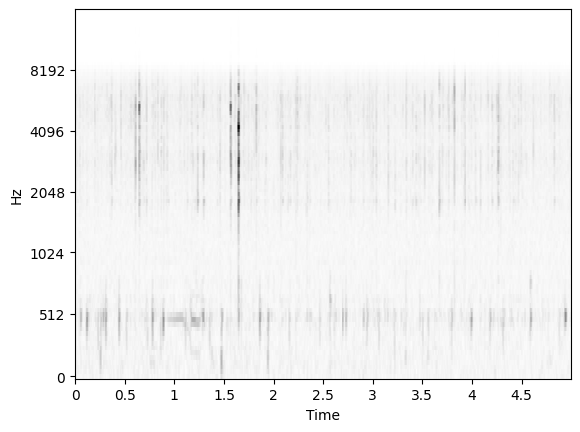

rank        : 2
source file : raw_audio/20230219_160800.WAV
offset_s    : 30.00
score       : -1.00


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


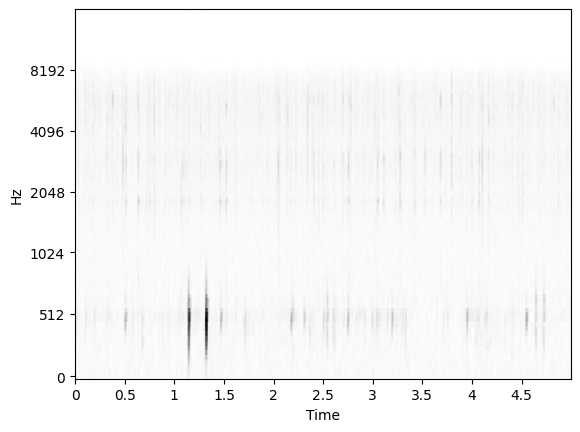

rank        : 3
source file : raw_audio/20230219_180400.WAV
offset_s    : 45.00
score       : -1.01


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


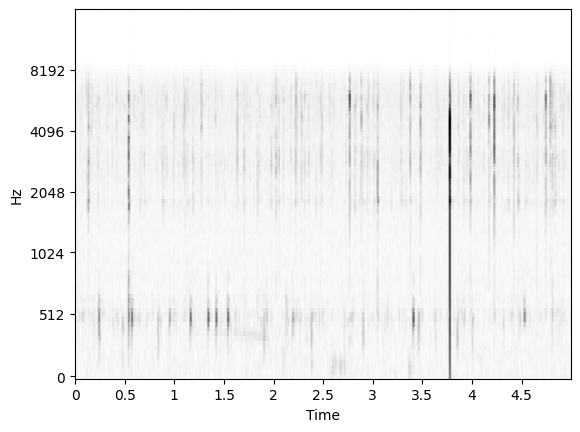

rank        : 4
source file : raw_audio/20230219_172400.WAV
offset_s    : 55.00
score       : -1.01


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


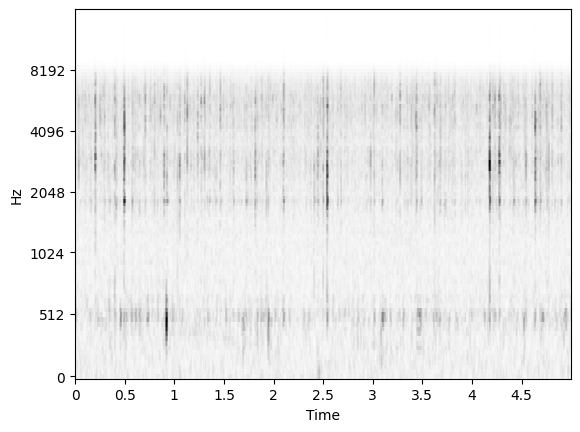

rank        : 5
source file : raw_audio/20230219_175200.WAV
offset_s    : 15.00
score       : -1.01


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


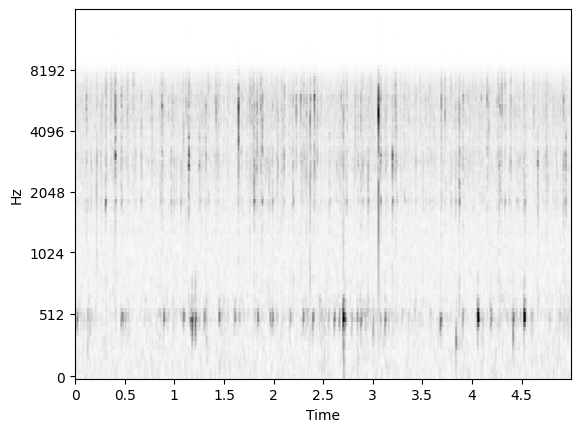

rank        : 6
source file : raw_audio/20230219_173200.WAV
offset_s    : 15.00
score       : -1.02


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


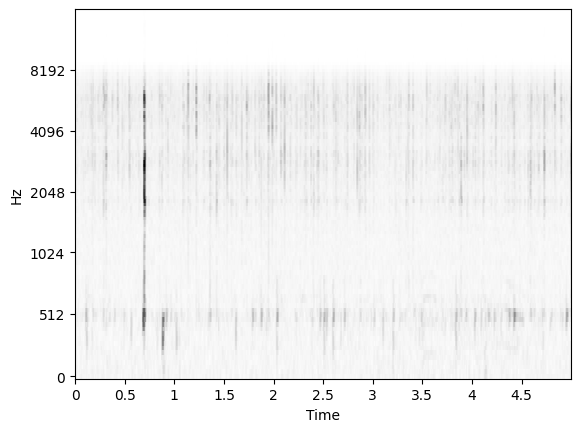

rank        : 7
source file : raw_audio/20230219_182400.WAV
offset_s    : 20.00
score       : -0.98


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


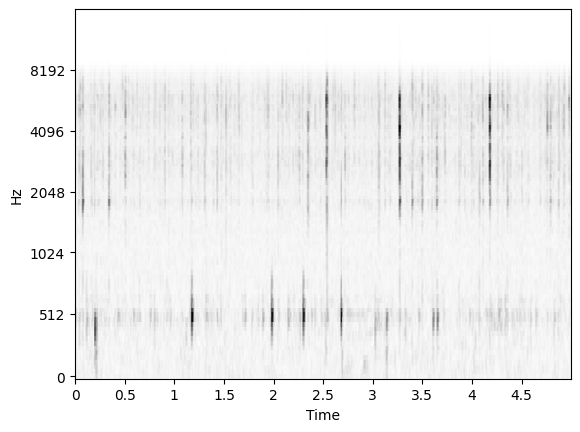

rank        : 8
source file : raw_audio/20230219_165600.WAV
offset_s    : 30.00
score       : -0.97


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


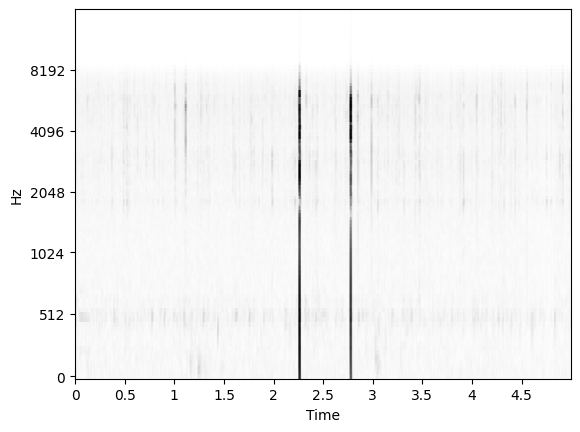

rank        : 9
source file : raw_audio/20230219_164400.WAV
offset_s    : 20.00
score       : -1.03


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


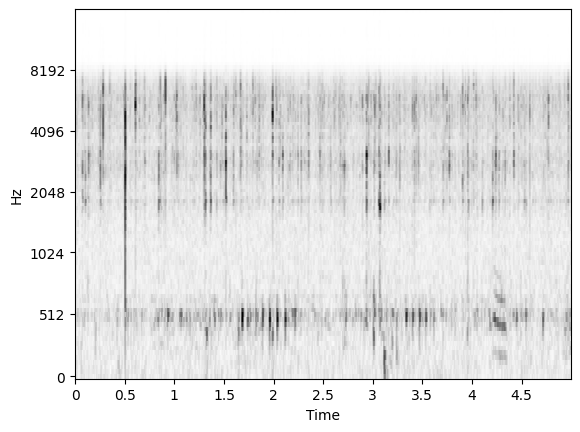

rank        : 10
source file : raw_audio/20230219_190400.WAV
offset_s    : 45.00
score       : -1.03


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


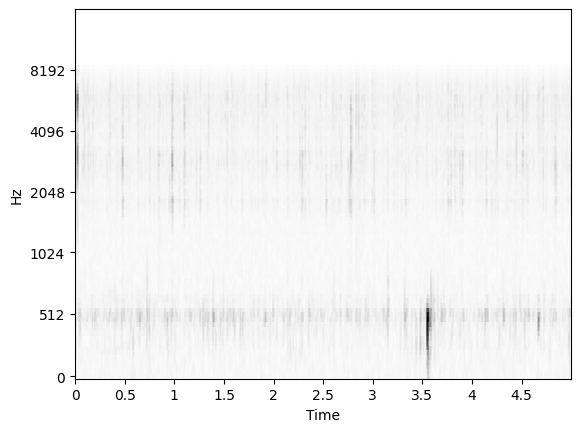

rank        : 11
source file : raw_audio/20230219_192400.WAV
offset_s    : 20.00
score       : -1.03


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


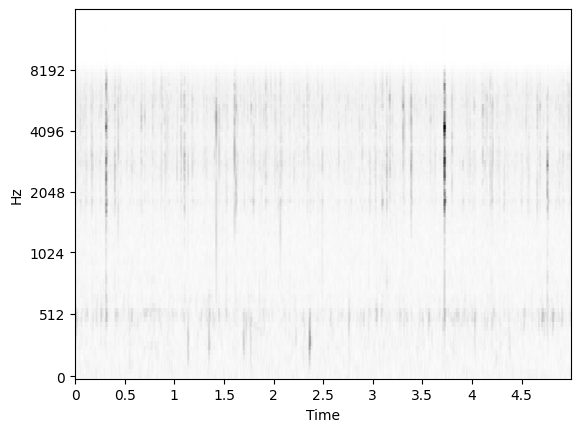

rank        : 12
source file : raw_audio/20230219_185200.WAV
offset_s    : 10.00
score       : -1.03


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


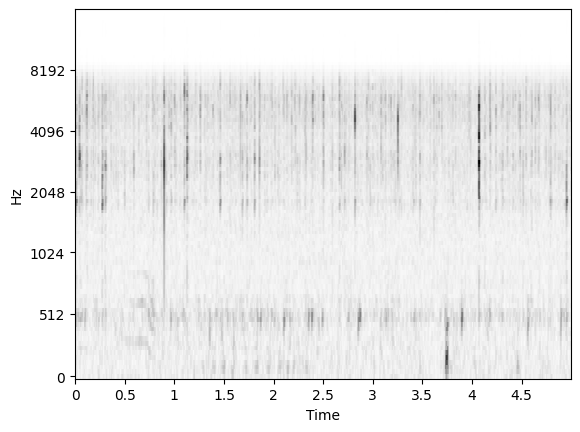

rank        : 13
source file : raw_audio/20230219_160400.WAV
offset_s    : 5.00
score       : -1.03


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


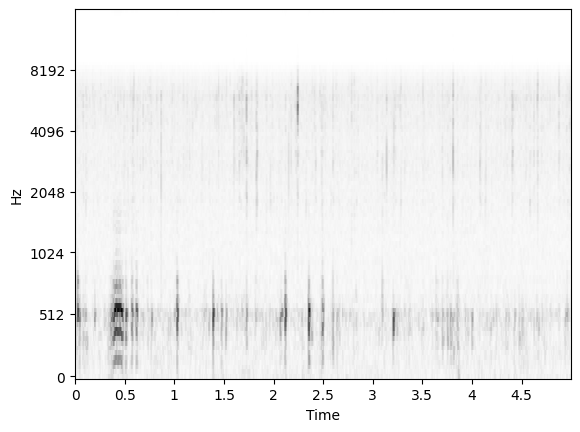

rank        : 14
source file : raw_audio/20230219_231600.WAV
offset_s    : 20.00
score       : -1.04


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


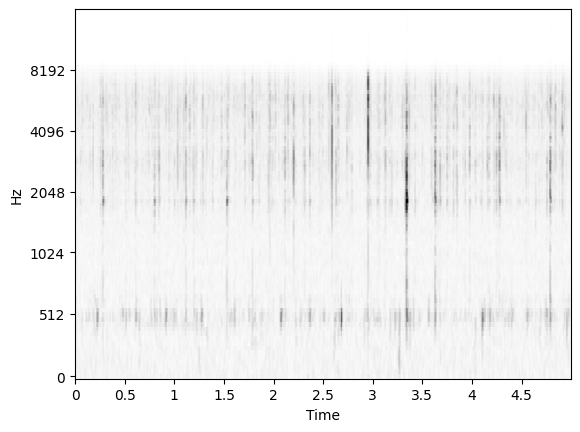

rank        : 15
source file : raw_audio/20230219_172800.WAV
offset_s    : 15.00
score       : -1.04


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


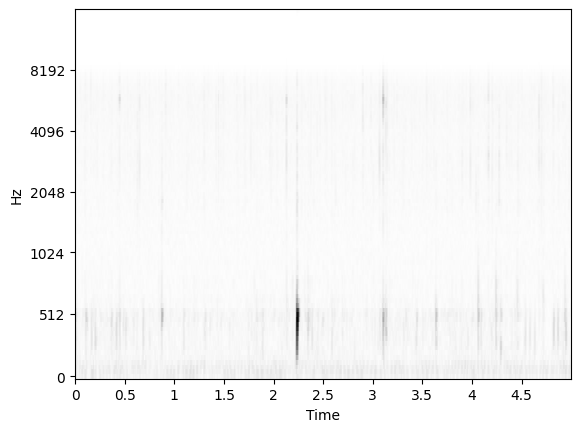

rank        : 16
source file : raw_audio/20230220_033600.WAV
offset_s    : 25.00
score       : -0.96


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


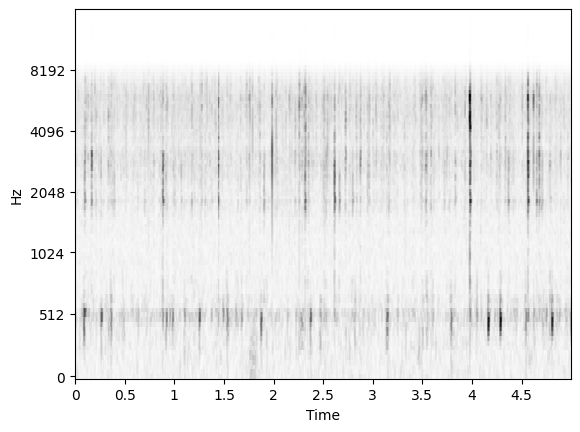

rank        : 17
source file : raw_audio/20230219_191600.WAV
offset_s    : 15.00
score       : -0.96


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


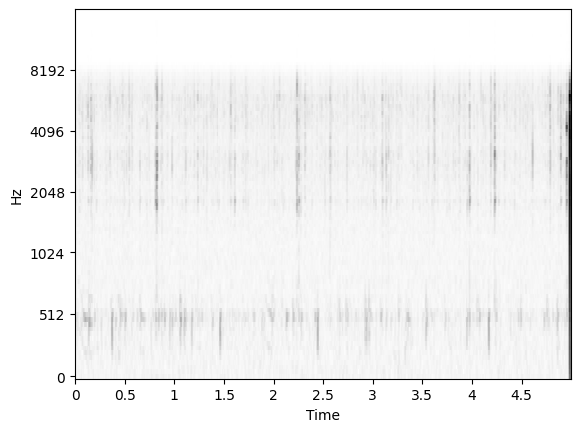

rank        : 18
source file : raw_audio/20230219_173600.WAV
offset_s    : 50.00
score       : -1.04


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


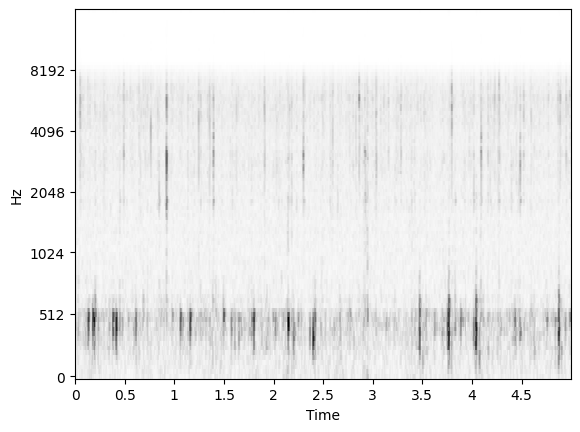

rank        : 19
source file : raw_audio/20230220_063600.WAV
offset_s    : 25.00
score       : -0.96


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


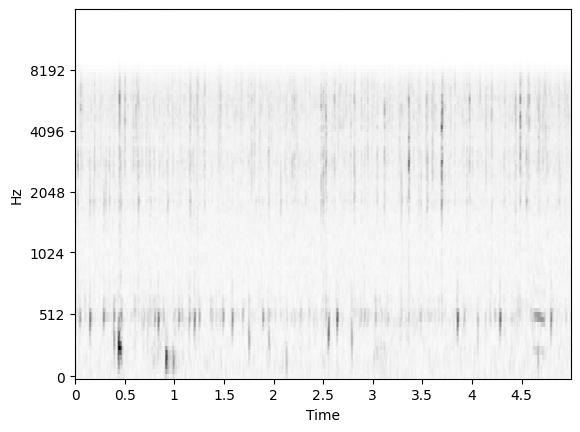

rank        : 20
source file : raw_audio/20230219_163200.WAV
offset_s    : 20.00
score       : -1.05


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


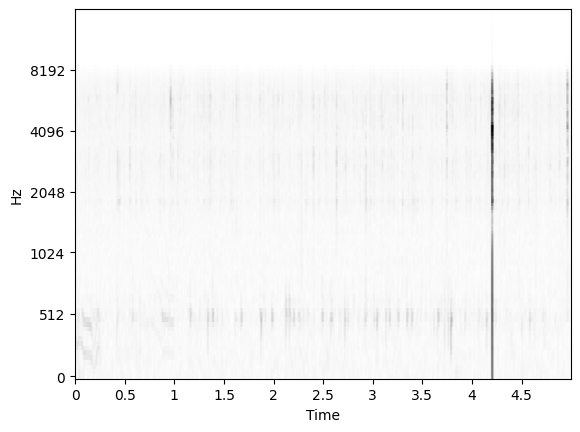

rank        : 21
source file : raw_audio/20230219_171200.WAV
offset_s    : 30.00
score       : -1.05


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


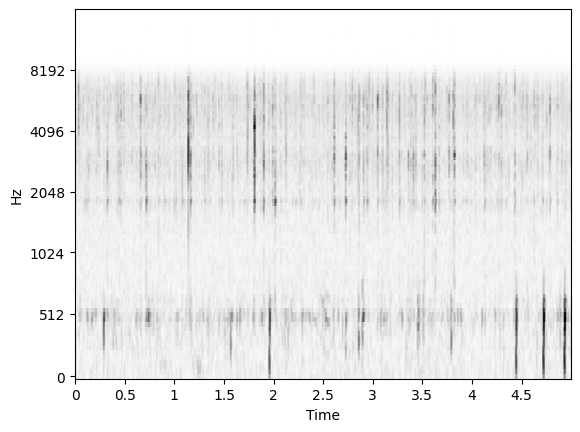

rank        : 22
source file : raw_audio/20230219_173600.WAV
offset_s    : 55.00
score       : -0.95


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


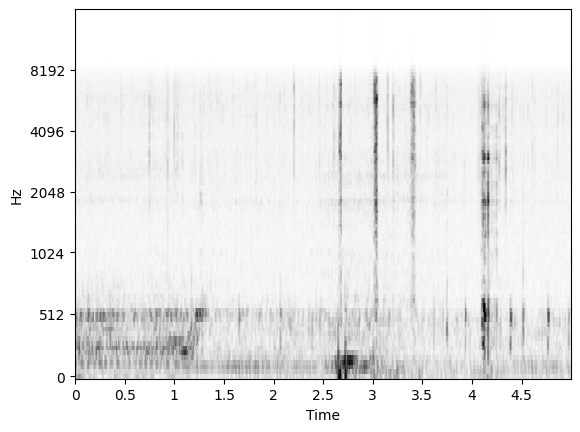

rank        : 23
source file : raw_audio/20230220_034000.WAV
offset_s    : 0.00
score       : -1.05


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


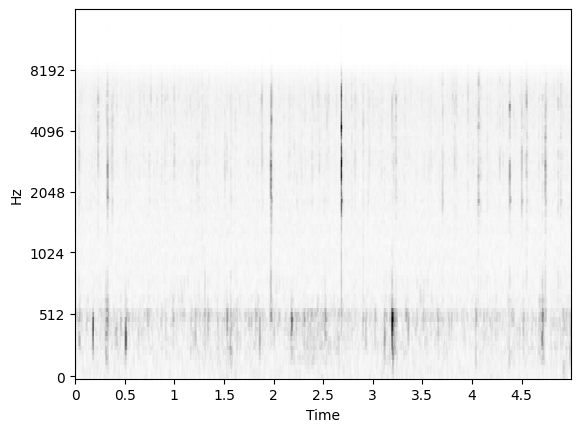

rank        : 24
source file : raw_audio/20230220_072000.WAV
offset_s    : 25.00
score       : -0.95


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


In [63]:
#@title Display results for the target label. { vertical-output: true }

display_labels = merged.labels

extra_labels = []  #@param
for label in extra_labels:
  if label not in merged.labels:
    display_labels += (label,)
if 'unknown' not in merged.labels:
  display_labels += ('unknown',)

display.display_search_results(
    results, embedding_model.sample_rate,
    project_state.source_map,
    checkbox_labels=display_labels,
    max_workers=5)

In [64]:
#@title Add selected results to the labeled data. { vertical-output: true }

results.write_labeled_data(
    config.annotated_path, embedding_model.sample_rate)

Wrote 23 examples for label unknown
Wrote 2 examples for label unknown exists


Now either:
1. Return to step 2 to retrain the small classifier using the newly added labeled data. This new data should help further improve accuracy of the trained classifier.
2. Progress onto step 5 to run the trained classifier on the full dataset.

## Step 5: Finish
- This step will take the trained classifier and inference on the full dataset which was embedded in notebook 1.
- TODO: USE THE REULSTS FILE ... TO ...

In [69]:
#@title Write classifier inference CSV. { vertical-output: true }

threshold = 0 # Default is 1.0  #@param

# Create the embeddings dataset.
embeddings_ds = tf_examples.create_embeddings_dataset(
    embeddings_path, file_glob='embeddings-*')

def classify_batch(batch):
  """Classify a batch of embeddings."""
  emb = batch[tf_examples.EMBEDDING]
  emb_shape = tf.shape(emb)
  flat_emb = tf.reshape(emb, [-1, emb_shape[-1]])
  logits = model(flat_emb)
  logits = tf.reshape(
      logits, [emb_shape[0], emb_shape[1], tf.shape(logits)[-1]])
  # Take the maximum logit over channels.
  logits = tf.reduce_max(logits, axis=-2)
  batch['logits'] = logits
  return batch

inference_ds = tf_examples.create_embeddings_dataset(
    embeddings_path, file_glob='embeddings-*')
inference_ds = inference_ds.map(
    classify_batch, num_parallel_calls=tf.data.AUTOTUNE
)

with open(output_filepath, 'w') as f:
  # Write column headers.
  headers = ['filename', 'timestamp_s', 'label', 'logit']
  f.write(', '.join(headers) + '\n')
  for ex in tqdm.tqdm(inference_ds.as_numpy_iterator()):
    for t in range(ex['logits'].shape[0]):
      for i, label in enumerate(merged.labels):
        if ex['logits'][t, i] > threshold:
          offset = ex['timestamp_s'] + t * config.embedding_hop_size_s
          logit = '{:.2f}'.format(ex['logits'][t, i])
          row = [ex['filename'].decode('utf-8'),
                 '{:.2f}'.format(offset),
                 label, logit]
          f.write(', '.join(row) + '\n')


240it [00:00, 349.88it/s]
